### 2D Seismic Images Input

In [35]:
from PIL import Image
import matplotlib.pyplot as plt
import os
import numpy as np
import cv2
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import array_to_img
%matplotlib inline

Text(0.5, 1.0, 'Inline 2900  - with interpretation')

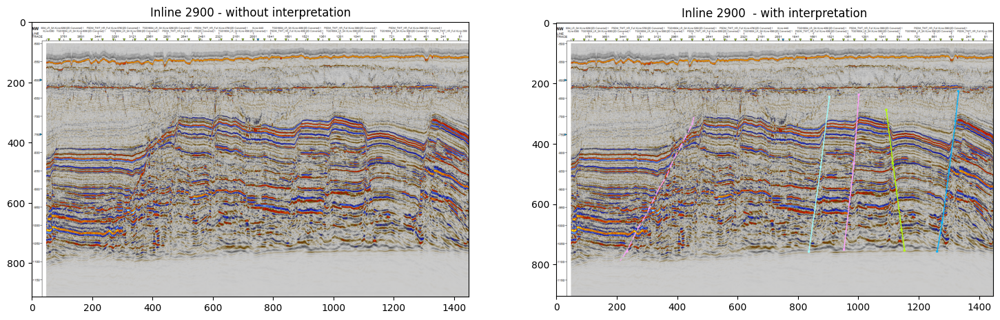

In [36]:
# Load the image from PIL library

image_dir = os.path.join('seismic_images/old/IL/', 'IL2900-')
image1 = Image.open(image_dir + 'without.png')
image2 = Image.open(image_dir + 'with.png')

# Convert the images in numpy format or opencv

np_frame1 = np.array(image1.getdata())
np_frame2 = np.array(image2.getdata())

# By using keras.preprocessing.image for conversion
img_numpy_array1 = img_to_array(image1)
img_numpy_array2 = img_to_array(image2)

# Display the images using Matplotlib
fig = plt.figure(figsize=(18,18))

ax = fig.add_subplot(1, 2, 1)
plt.imshow(image1)
ax.set_title(f'Inline 2900 - without interpretation')

ax = fig.add_subplot(1, 2, 2)
plt.imshow(image2)
ax.set_title(f'Inline 2900  - with interpretation')

Text(0.5, 1.0, 'Labelled Image')

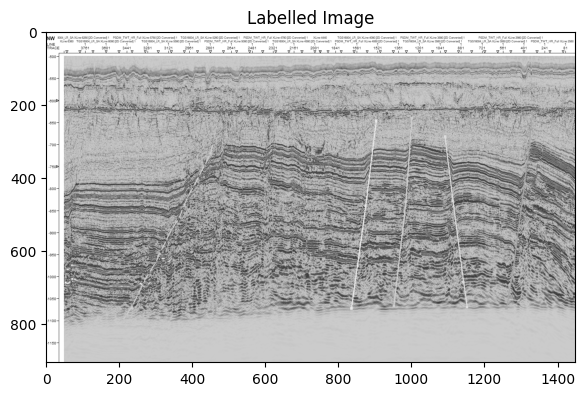

In [37]:
image_path = 'seismic_images/old/IL/IL2900-with.png'

# Opencv grayscale
img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

plt.figure(figsize=(15,15))
plt.subplot(121)
plt.imshow(img,cmap='gray')
plt.title('Labelled Image')

In [38]:
print(img.shape)
img_numpy_array2.shape

(905, 1447)


(905, 1447, 4)

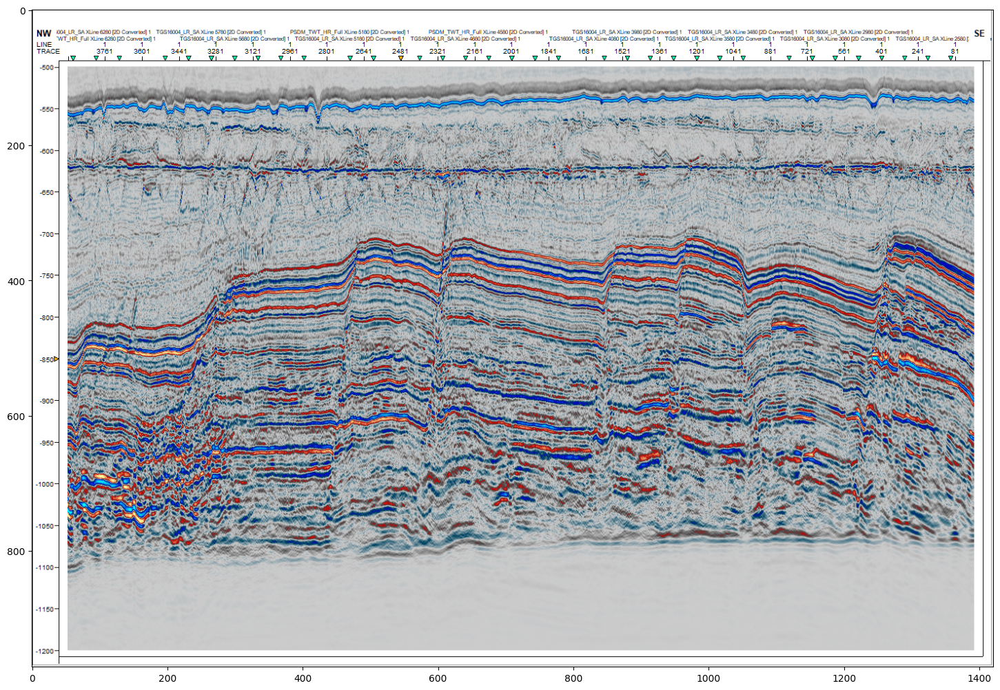

In [39]:
#img_path = os.path.join('seismic_images/images_IL_XL_labels/seismic', 'IL2800.png')
image_path = 'seismic_images/images_IL_XL_labels/seismic/IL2800.png'
seismic_image = cv2.imread(image_path, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(18,18))
plt.imshow(seismic_image)
plt.show()

---------------
### 2D Seismic Images and Labels Input

In [40]:
import os
from os.path import isfile, join
from os import walk
import time
import cv2
import math

In [41]:
def load_pathnames_filenames(path): # read and store all file names in order
    for (_, dirnames, _) in walk(path):
        print("dirnames", dirnames)
        break

    label_path = join(path, dirnames[0])
    seismics_path = join(path, dirnames[1])

    for (_, _, filenames) in walk(label_path):
        labels = sorted(filenames)
    for (_, _, filenames) in walk(seismics_path):
        seismic = sorted(filenames)

    print("number of images in two folder: ",len(labels),len(seismic))
    print("label_path: ", label_path)
    print("seismics_path: ", seismics_path)

    print(labels[:10])
    print(seismic[:10])

    return label_path, seismics_path, labels, seismic

In [42]:
img_path = 'seismic_images/images_IL_XL_labels'
label_path, seismics_path, labels, seismic = load_pathnames_filenames(img_path)

dirnames ['labels', 'seismic']
number of images in two folder:  63 63
label_path:  seismic_images/images_IL_XL_labels\labels
seismics_path:  seismic_images/images_IL_XL_labels\seismic
['IL2800_fault.png', 'IL2900_fault.png', 'IL3000_fault.png', 'IL3100_fault.png', 'IL3200_fault.png', 'IL3300_fault.png', 'IL3400_fault.png', 'IL3500_fault.png', 'IL3600_fault.png', 'IL3700_fault.png']
['IL2800.png', 'IL2900.png', 'IL3000.png', 'IL3100.png', 'IL3200.png', 'IL3300.png', 'IL3400.png', 'IL3500.png', 'IL3600.png', 'IL3700.png']


In [43]:
img = cv2.imread(join(seismics_path,seismic[10]))
mask = cv2.imread(join(label_path,labels[10]))
print(img.shape)
print(mask.shape)

(972, 1421, 3)
(972, 1421, 3)


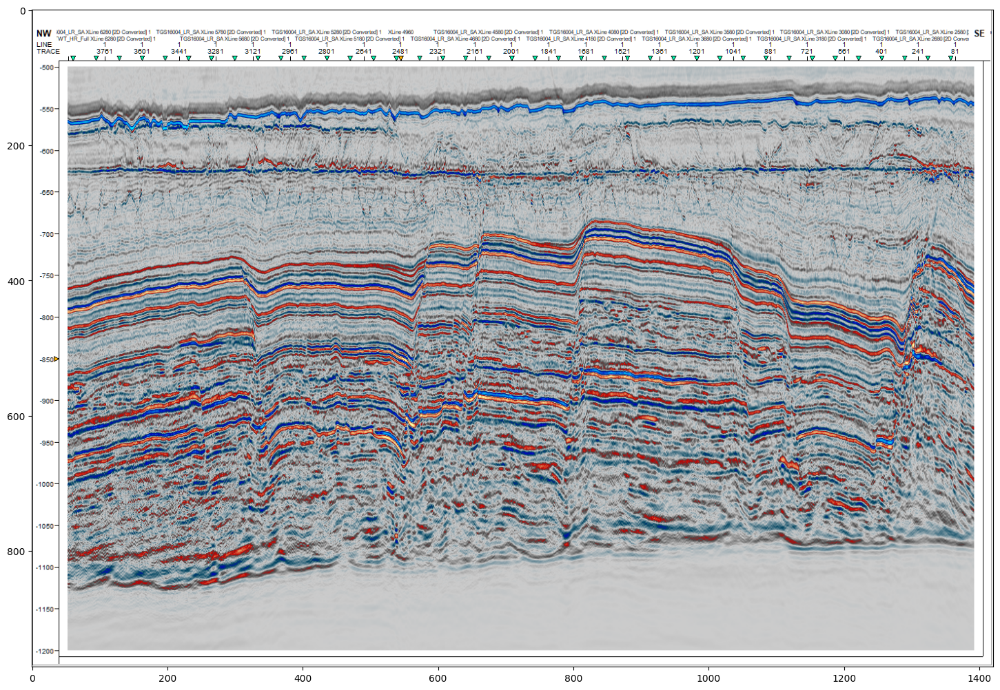

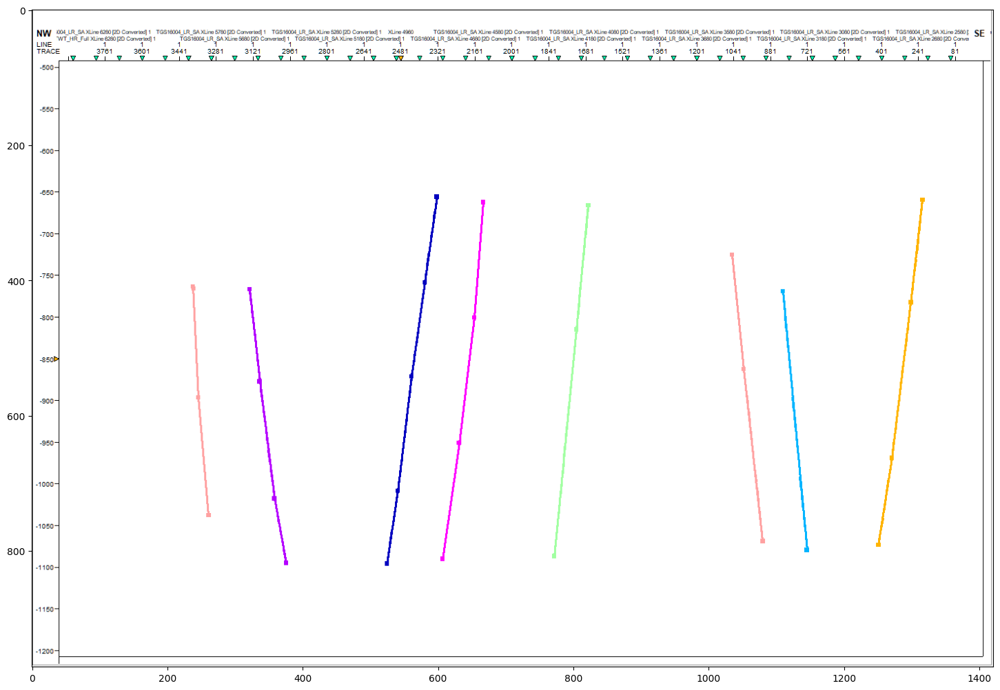

In [44]:
plt.figure(figsize=(18,18))
plt.imshow(img)
plt.show()
plt.figure(figsize=(18,18))
plt.imshow(mask)
plt.show()

### Cropping off the axis of images

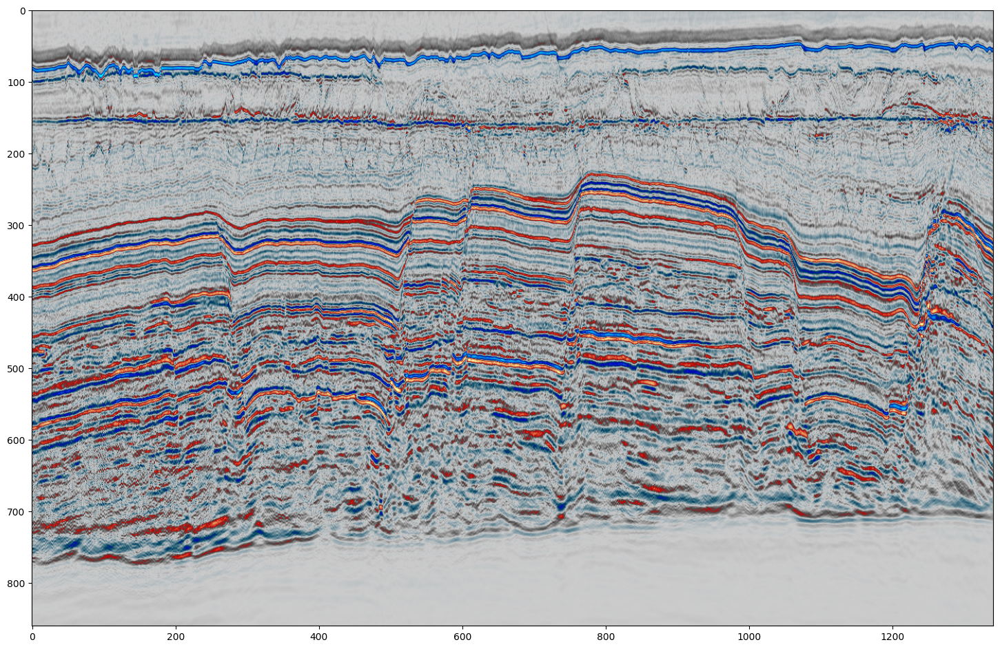

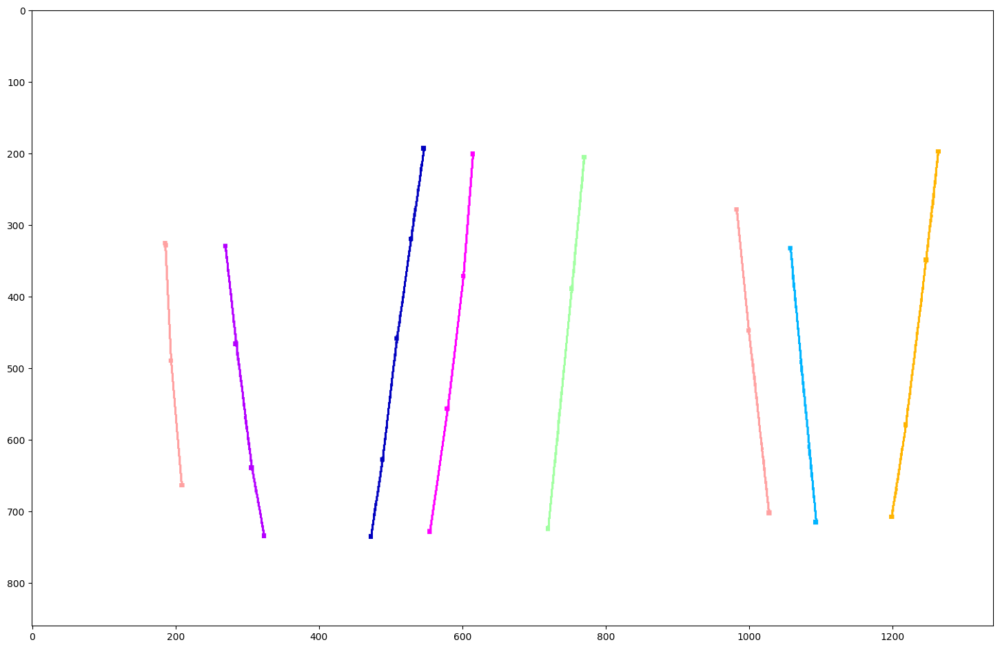

In [45]:
plt.figure(figsize=(18,18))
plt.imshow(img[84:-28,52:-28,:]) # Height and width of Region of Interest (y1:y2, x1:x2, channels)
plt.show()
plt.figure(figsize=(18,18))
plt.imshow(mask[84:-28,52:-28,:]) # Height and width of Region of Interest (y1:y2, x1:x2, channels)
plt.show()

In [46]:
mask1 = mask[84:-28,52:-28,:]
print(mask1.shape)
maskgray = cv2.cvtColor(mask1, cv2.COLOR_BGR2GRAY)
print(maskgray.shape)
print(maskgray.max(), maskgray.min())

(860, 1341, 3)
(860, 1341)
255 57


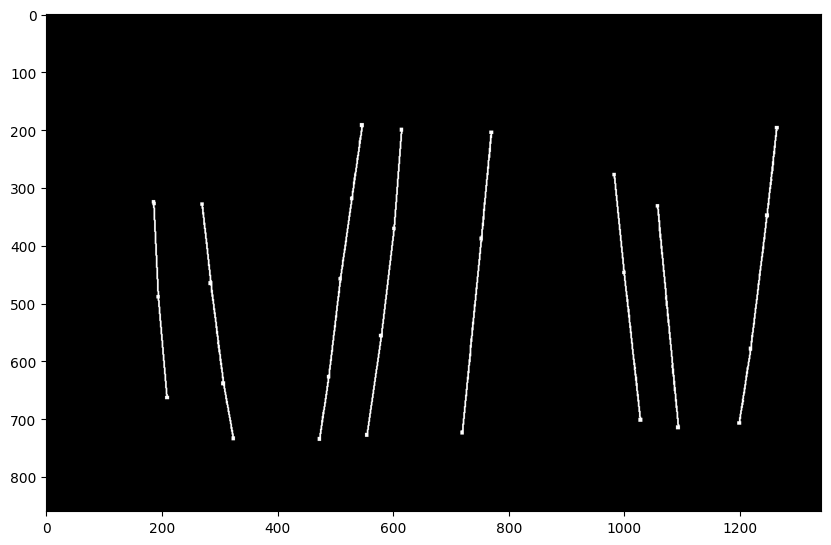

In [47]:
plt.figure(figsize=(10,10))
plt.imshow(maskgray<255,cmap='gray')
plt.show()

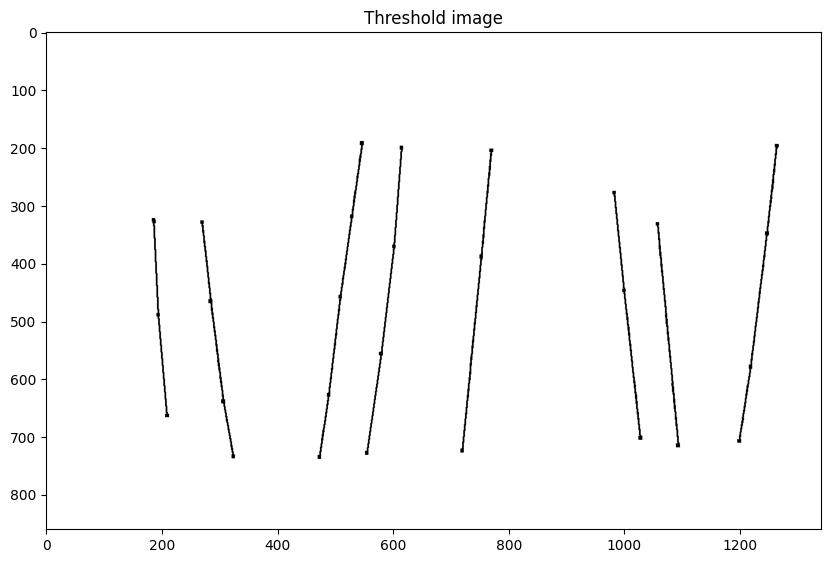

In [48]:
_, binary_image = cv2.threshold(maskgray,254,255, cv2.THRESH_BINARY) 

plt.figure(figsize=(10,10))
plt.imshow(binary_image, cmap='gray', vmin=0, vmax=255)
plt.title('Threshold image')
plt.show()

save the cropped gray images in a new folder

In [50]:
def load_and_crop_images(input_folder, output_folder):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
    
    # Get a list of all files in the input folder
    files = os.listdir(input_folder)
    
    for file_name in files:
        if file_name.lower().endswith(('.png')):
            image_path = os.path.join(input_folder, file_name)
            image = cv2.imread(image_path)
            image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) # Gray channel only
            
            if image is not None:
                cropped_image = image_gray[84:-28,52:-28] # Crop the image
                output_path = os.path.join(output_folder, file_name)
                cv2.imwrite(output_path, cropped_image)
                print(f"Cropped and saved {file_name} to {output_path}")
            else:
                print(f"Error reading {file_name}")

input_folder = "seismic_images/images_IL_XL_labels/seismic"
output_folder = "seismic_images/images_IL_XL_labels/seismic/seismic_gray"

load_and_crop_images(input_folder, output_folder)


Cropped and saved IL2800.png to seismic_images/images_IL_XL_labels/seismic/seismic_gray\IL2800.png
Cropped and saved IL2900.png to seismic_images/images_IL_XL_labels/seismic/seismic_gray\IL2900.png
Cropped and saved IL3000.png to seismic_images/images_IL_XL_labels/seismic/seismic_gray\IL3000.png
Cropped and saved IL3100.png to seismic_images/images_IL_XL_labels/seismic/seismic_gray\IL3100.png
Cropped and saved IL3200.png to seismic_images/images_IL_XL_labels/seismic/seismic_gray\IL3200.png
Cropped and saved IL3300.png to seismic_images/images_IL_XL_labels/seismic/seismic_gray\IL3300.png
Cropped and saved IL3400.png to seismic_images/images_IL_XL_labels/seismic/seismic_gray\IL3400.png
Cropped and saved IL3500.png to seismic_images/images_IL_XL_labels/seismic/seismic_gray\IL3500.png
Cropped and saved IL3600.png to seismic_images/images_IL_XL_labels/seismic/seismic_gray\IL3600.png
Cropped and saved IL3700.png to seismic_images/images_IL_XL_labels/seismic/seismic_gray\IL3700.png
Cropped an